<a href="https://colab.research.google.com/github/TioSatrio100/ADHD-EEG-ATCNET/blob/main/ADHD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [124]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, Model
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler


In [17]:
!pip install mne

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 23.3 MB/s eta 0:00:00


In [21]:
import mne

In [6]:
data = pd.read_csv('adhd2.csv')
data

,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,O2,F7,F8,T7,T8,P7,P8,Fz,Cz,Pz,class
0,85.0,261.0,52.0,226.0,52.0,200.0,126.0,310.0,-20.0,236.0,126.0,200.0,-20.0,200.0,-20.0,347.0,85.0,50.0,85.0,0
1,156.0,508.0,126.0,226.0,126.0,236.0,89.0,310.0,-57.0,273.0,273.0,420.0,16.0,310.0,-57.0,89.0,297.0,121.0,85.0,0
2,297.0,473.0,89.0,332.0,52.0,163.0,-167.0,236.0,-20.0,126.0,236.0,273.0,-57.0,126.0,-167.0,273.0,402.0,15.0,-160.0,0
3,191.0,402.0,89.0,156.0,89.0,89.0,-94.0,163.0,-167.0,200.0,89.0,200.0,-57.0,52.0,-167.0,89.0,85.0,156.0,-90.0,0
4,156.0,402.0,89.0,121.0,52.0,126.0,-131.0,89.0,16.0,89.0,126.0,200.0,-20.0,52.0,-131.0,52.0,332.0,121.0,-55.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1918623,50.0,85.0,52.0,50.0,52.0,52.0,52.0,16.0,16.0,52.0,126.0,126.0,126.0,126.0,163.0,89.0,50.0,-19.0,50.0,1
1918624,121.0,85.0,126.0,15.0,126.0,16.0,52.0,16.0,-20.0,16.0,163.0,89.0,163.0,16.0,126.0,-20.0,50.0,-55.0,50.0,1
1918625,15.0,-55.0,52.0,-90.0,89.0,-57.0,89.0,-20.0,200.0,16.0,89.0,16.0,126.0,-20.0,52.0,-20.0,-19.0,-19.0,85.0,1
1918626,85.0,121.0,126.0,50.0,200.0,52.0,163.0,52.0,163.0,163.0,163.0,89.0,200.0,126.0,163.0,163.0,85.0,121.0,121.0,1


In [7]:
data.head()

,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,O2,F7,F8,T7,T8,P7,P8,Fz,Cz,Pz,class
0,85.0,261.0,52.0,226.0,52.0,200.0,126.0,310.0,-20.0,236.0,126.0,200.0,-20.0,200.0,-20.0,347.0,85.0,50.0,85.0,0
1,156.0,508.0,126.0,226.0,126.0,236.0,89.0,310.0,-57.0,273.0,273.0,420.0,16.0,310.0,-57.0,89.0,297.0,121.0,85.0,0
2,297.0,473.0,89.0,332.0,52.0,163.0,-167.0,236.0,-20.0,126.0,236.0,273.0,-57.0,126.0,-167.0,273.0,402.0,15.0,-160.0,0
3,191.0,402.0,89.0,156.0,89.0,89.0,-94.0,163.0,-167.0,200.0,89.0,200.0,-57.0,52.0,-167.0,89.0,85.0,156.0,-90.0,0
4,156.0,402.0,89.0,121.0,52.0,126.0,-131.0,89.0,16.0,89.0,126.0,200.0,-20.0,52.0,-131.0,52.0,332.0,121.0,-55.0,0


# **DATA VISUALIZATION**

<Axes: xlabel='class', ylabel='count'>

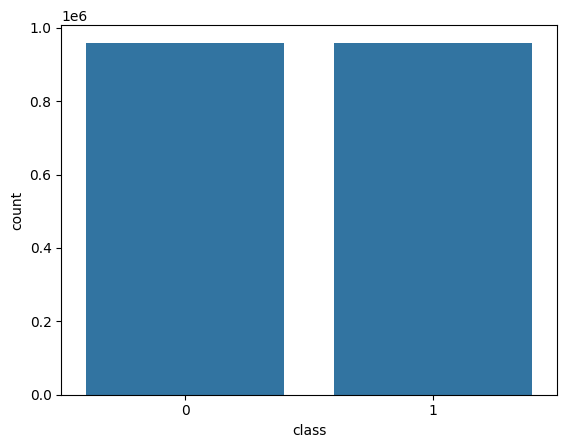

In [10]:
sns.countplot(x=data['class'], data=data)


In [11]:
data_normal = data[:959314]
data_normal.tail()
data_adhd = data[959314:]

In [24]:
channel_names = data.columns.tolist()
channel_names.remove('class')

In [25]:
# Define sampling frequency
sfreq = 128  # Sampling frequency in Hz

# Create MNE info object
info = mne.create_info(ch_names=channel_names, sfreq=sfreq, ch_types='eeg')

# Display the MNE info object
print(info)

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F3, F4, C3, C4, P3, P4, O1, O2, F7, F8, T7, T8, P7, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 128.0 Hz
>


In [26]:
# Set the montage using standard 10-20 system
montage = mne.channels.make_standard_montage('standard_1020')
info.set_montage(montage)

# Display the updated MNE info object with montage
print(info)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F3, F4, C3, C4, P3, P4, O1, O2, F7, F8, T7, T8, P7, ...
 chs: 19 EEG
 custom_ref_applied: False
 dig: 22 items (3 Cardinal, 19 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 128.0 Hz
>


In [27]:
# Convert DataFrame to NumPy array
eeg_adhd_data = data_adhd.drop('class', axis=1)
eeg_adhd_data = eeg_adhd_data.values.T  # Transpose to have channels as rows and samples as columns

# Create RawArray object with EEG data and MNE info
raw_adhd = mne.io.RawArray(eeg_adhd_data, info)

# Display the Raw object
print(raw_adhd)

Creating RawArray with float64 data, n_channels=19, n_times=959314
    Range : 0 ... 959313 =      0.000 ...  7494.633 secs
Ready.
<RawArray | 19 x 959314 (7494.6 s), ~139.1 MB, data loaded>


In [28]:
eeg_normal_data = data_normal.drop('class',axis=1)
eeg_normal_data = eeg_normal_data.values.T
raw_normal = mne.io.RawArray(eeg_normal_data, info)

Creating RawArray with float64 data, n_channels=19, n_times=959314
    Range : 0 ... 959313 =      0.000 ...  7494.633 secs
Ready.


Attempting to create new mne-python configuration file:
/root/.mne/mne-python.json
Using matplotlib as 2D backend.


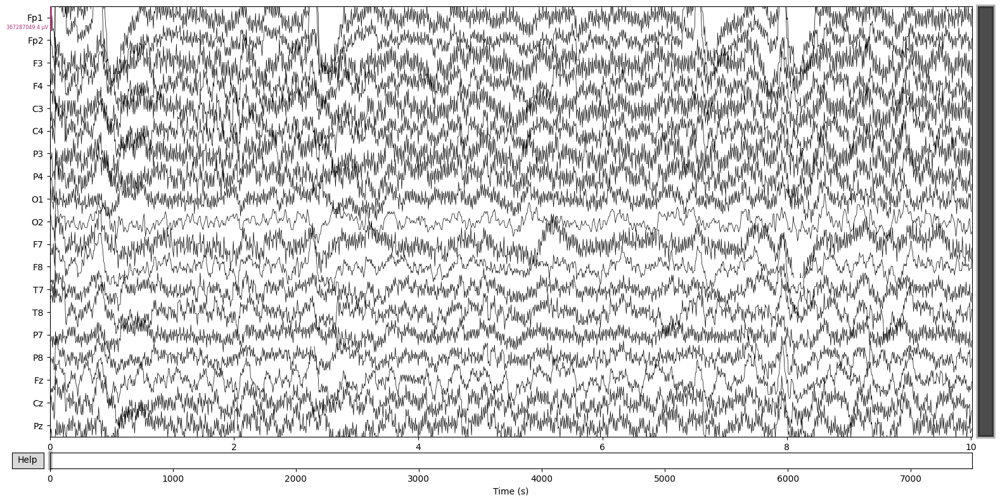

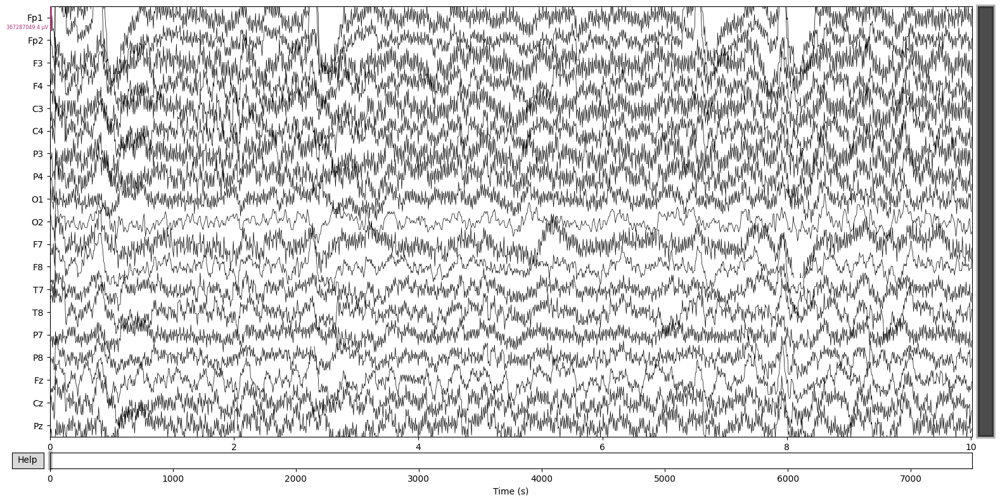

In [29]:
# Plot raw EEG data
mne.set_config('MNE_BROWSE_RAW_SIZE','16,8')
raw_adhd.plot(n_channels=len(channel_names), scalings='auto', title='Raw EEG Data')

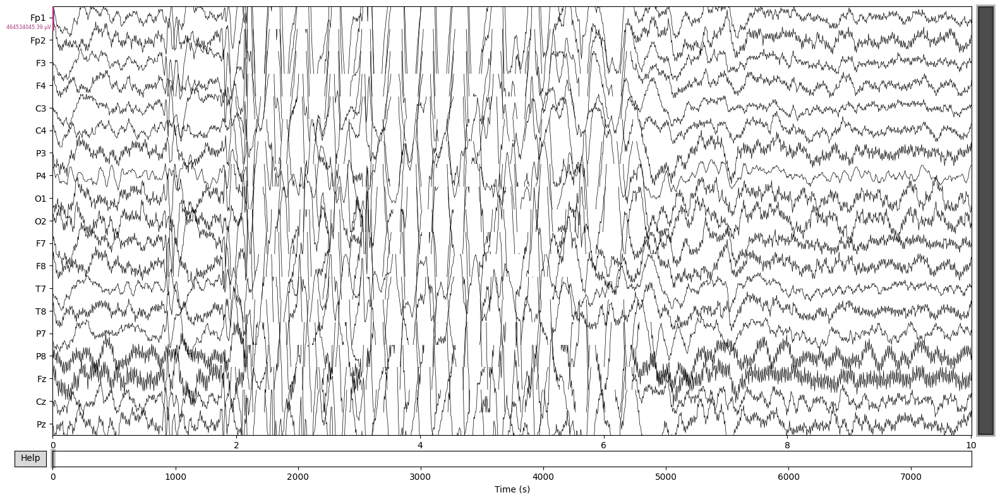

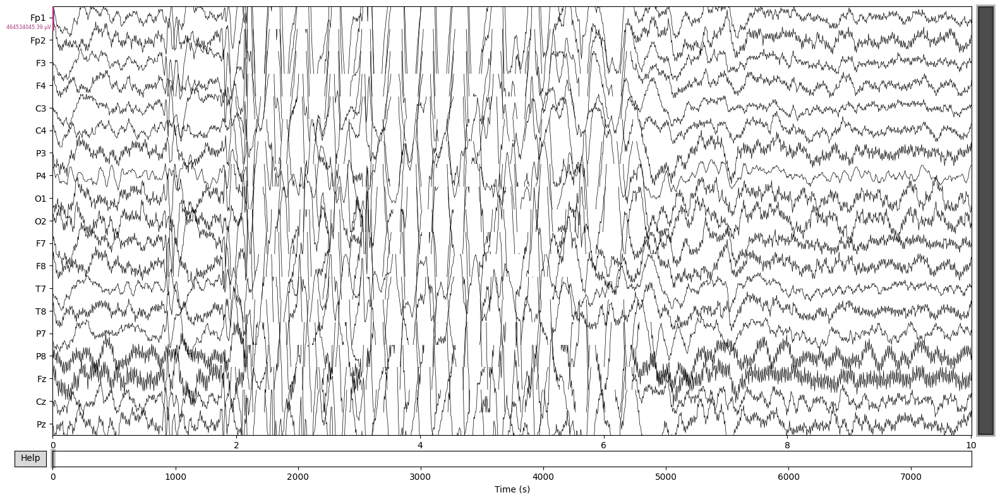

In [30]:
raw_normal.plot(n_channels=len(channel_names), scalings='auto', title='Raw EEG Data')

Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


<ipython-input-33-009e59cf6c28>:7: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_normal_filtered.compute_psd(fmax=60).plot()


Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


<ipython-input-33-009e59cf6c28>:11: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_adhd_filtered.compute_psd(fmax=60).plot()


Text(0.5, 1.0, 'ADHD After Filtering')

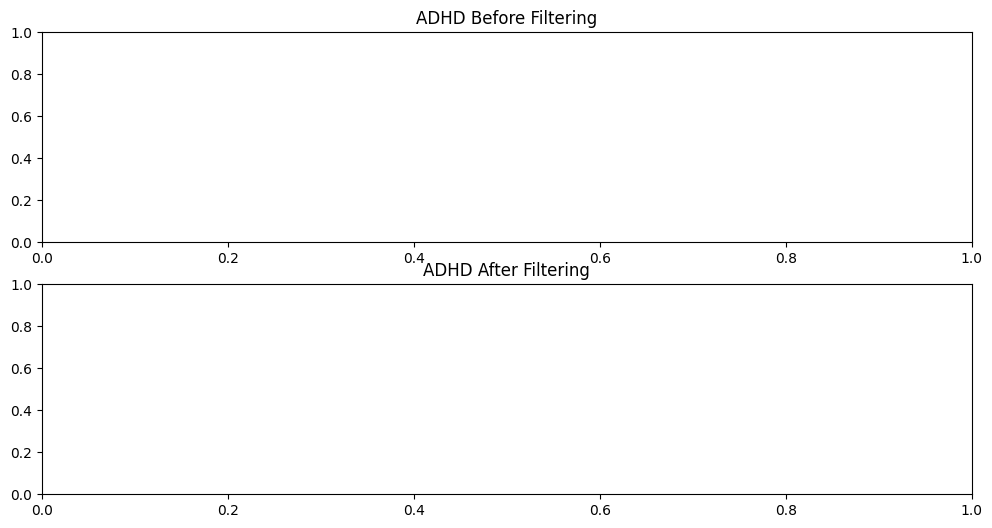

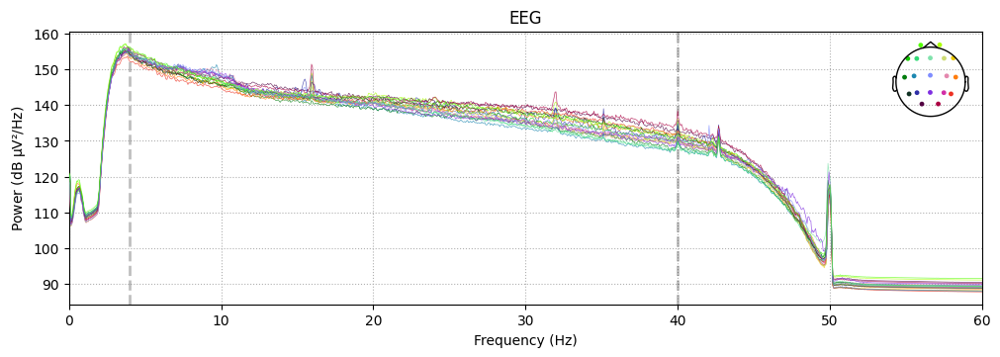

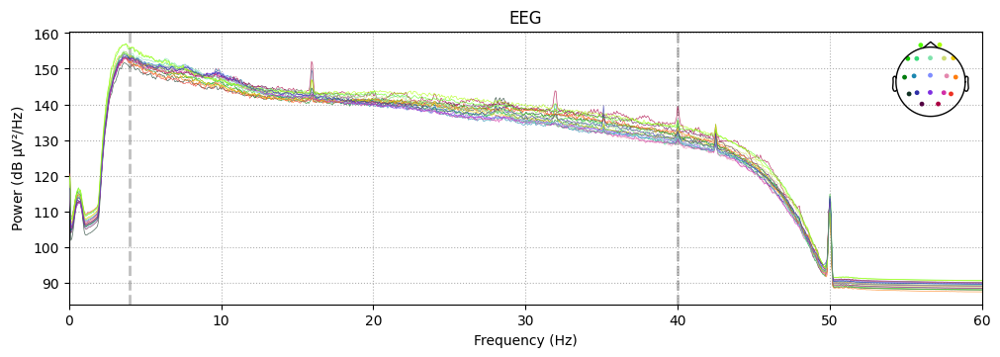

In [33]:
# Apply bandpass filter (4-40 Hz)
raw_normal_filtered = raw_normal.copy().filter(l_freq=4,h_freq = 40, method='fir', verbose=False)
raw_adhd_filtered = raw_adhd.copy().filter(l_freq=4,h_freq = 40, method='fir', verbose=False)
# Plot PSD before and after filtering
fig = plt.figure(figsize=(12, 6))
ax1 = fig.add_subplot(2, 1, 1)
raw_normal_filtered.compute_psd(fmax=60).plot()
ax1.set_title('ADHD Before Filtering')

ax2 = fig.add_subplot(2, 1, 2)
raw_adhd_filtered.compute_psd(fmax=60).plot()
ax2.set_title('ADHD After Filtering')

# plt.show()

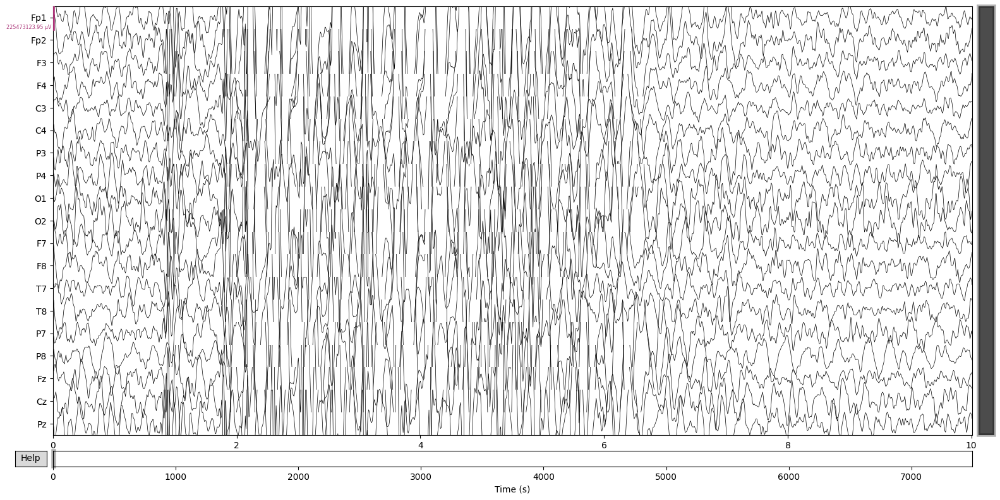

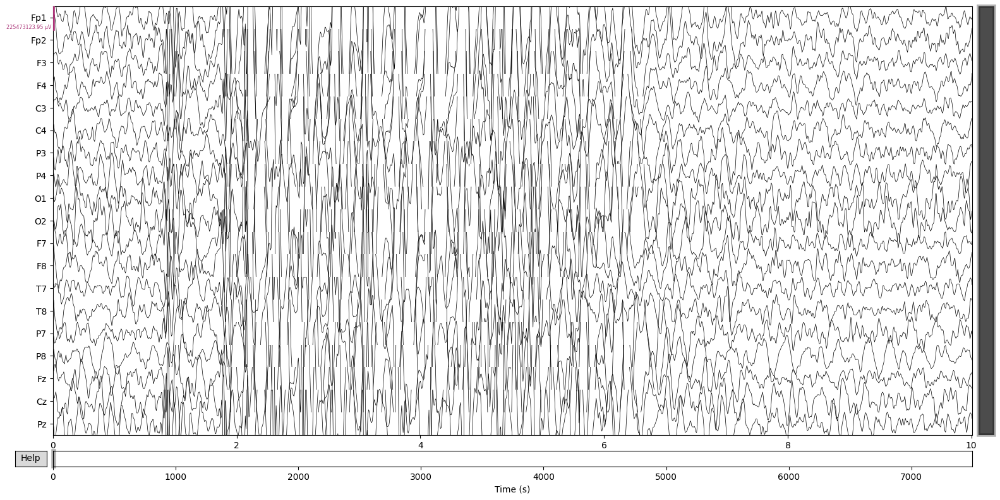

In [34]:
raw_normal_filtered.plot(scalings='auto')

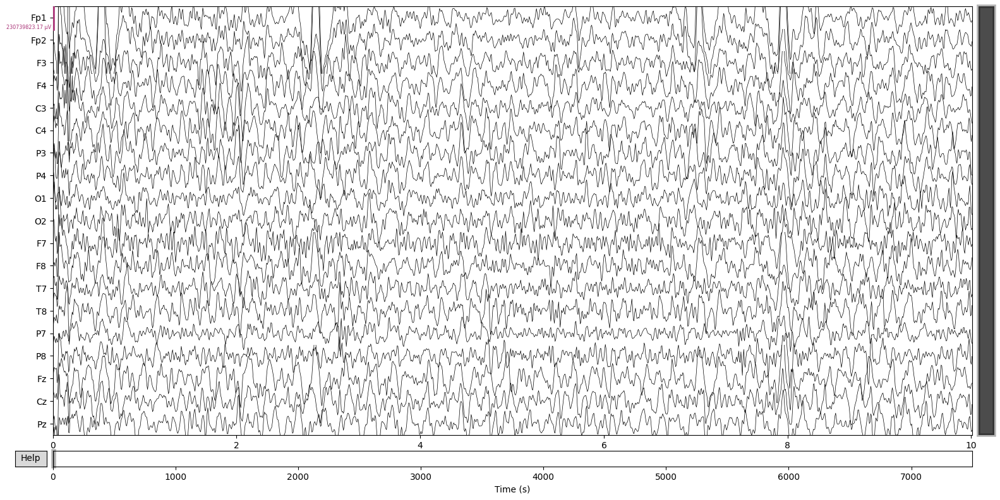

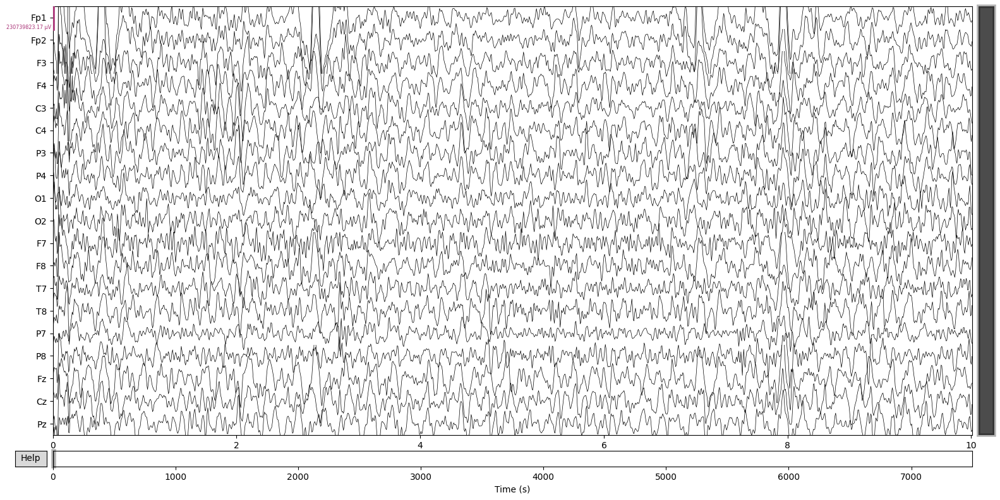

In [35]:
raw_adhd_filtered.plot(scalings='auto')

In [36]:
from mne.preprocessing import ICA

# Initialize ICA
ica_normal = ICA(n_components=19, random_state=42)

# Fit ICA to the preprocessed data
ica_normal.fit(raw_normal_filtered)

Fitting ICA to data using 19 channels (please be patient, this may take a while)
Selecting by number: 19 components
Fitting ICA took 70.0s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,41 iterations on raw data (959314 samples)
ICA components,19
Available PCA components,19
Channel types,eeg
ICA components marked for exclusion,—


In [37]:
# Identify components related to ocular artifacts
eog_inds, scores = ica_normal.find_bads_eog(raw_normal_filtered, ch_name=['Fp1','Fp2','F7','F8'], threshold=3)
print(eog_inds)

Using EOG channels: Fp1, Fp2, F7, F8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.6s



FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filte

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.2s



... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.1s


- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower pas

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.0s


[0]


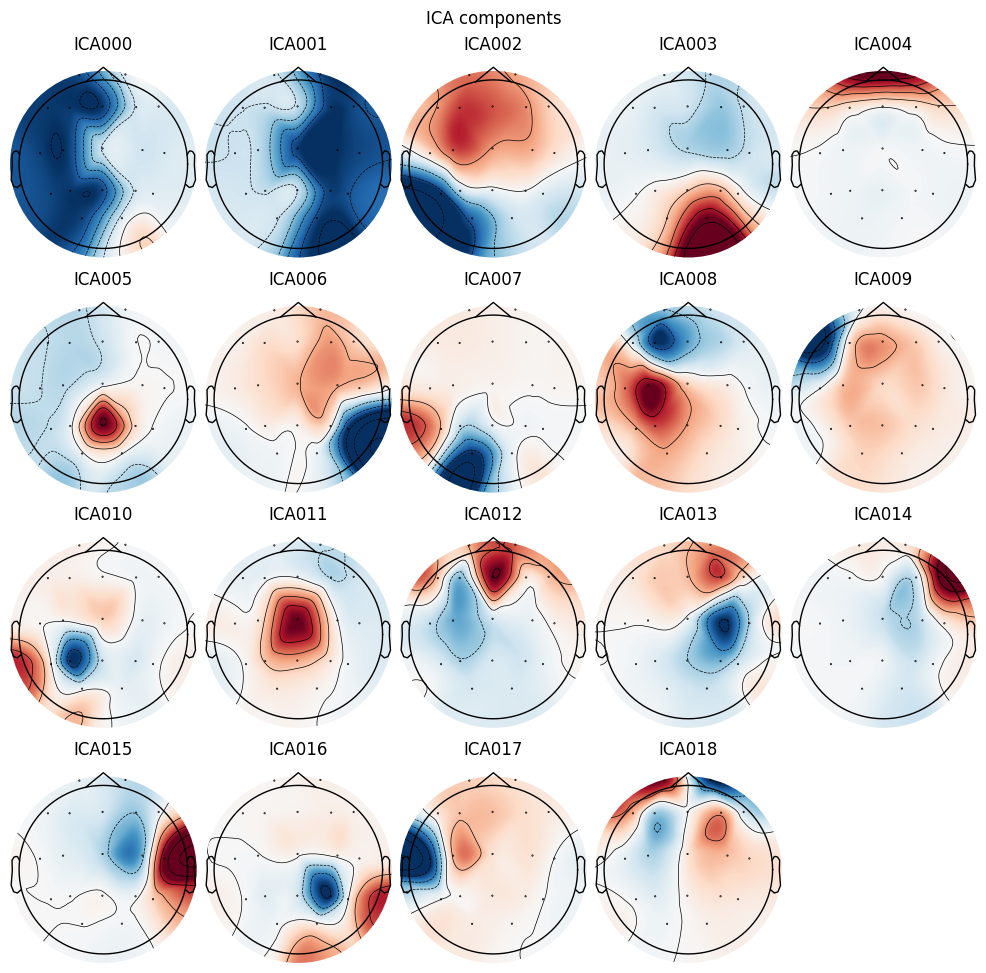

Creating RawArray with float64 data, n_channels=19, n_times=959314
    Range : 0 ... 959313 =      0.000 ...  7494.633 secs
Ready.


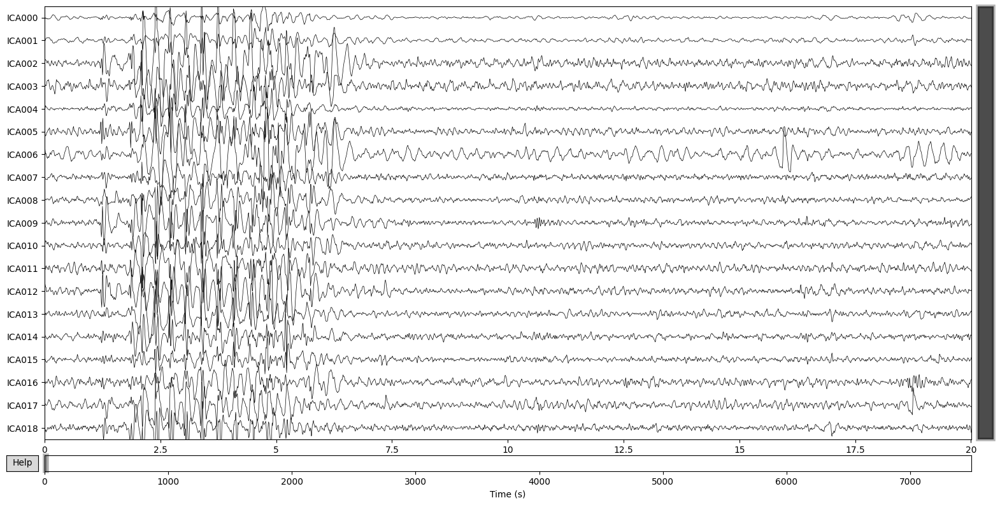

<Figure size 640x480 with 0 Axes>

In [38]:
# Plot ICA components in topographic maps
ica_normal.plot_components()

# Plot ICA components in waveform
ica_normal.plot_sources(raw_normal_filtered)
plt.set_cmap('viridis')  # Change 'viridis' to your desired colorscale
plt.show()

# **DATA PREDICTION**

In [109]:
df = pd.read_csv('adhd2.csv')
df

,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,O2,F7,F8,T7,T8,P7,P8,Fz,Cz,Pz,class
0,85.0,261.0,52.0,226.0,52.0,200.0,126.0,310.0,-20.0,236.0,126.0,200.0,-20.0,200.0,-20.0,347.0,85.0,50.0,85.0,0
1,156.0,508.0,126.0,226.0,126.0,236.0,89.0,310.0,-57.0,273.0,273.0,420.0,16.0,310.0,-57.0,89.0,297.0,121.0,85.0,0
2,297.0,473.0,89.0,332.0,52.0,163.0,-167.0,236.0,-20.0,126.0,236.0,273.0,-57.0,126.0,-167.0,273.0,402.0,15.0,-160.0,0
3,191.0,402.0,89.0,156.0,89.0,89.0,-94.0,163.0,-167.0,200.0,89.0,200.0,-57.0,52.0,-167.0,89.0,85.0,156.0,-90.0,0
4,156.0,402.0,89.0,121.0,52.0,126.0,-131.0,89.0,16.0,89.0,126.0,200.0,-20.0,52.0,-131.0,52.0,332.0,121.0,-55.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1918623,50.0,85.0,52.0,50.0,52.0,52.0,52.0,16.0,16.0,52.0,126.0,126.0,126.0,126.0,163.0,89.0,50.0,-19.0,50.0,1
1918624,121.0,85.0,126.0,15.0,126.0,16.0,52.0,16.0,-20.0,16.0,163.0,89.0,163.0,16.0,126.0,-20.0,50.0,-55.0,50.0,1
1918625,15.0,-55.0,52.0,-90.0,89.0,-57.0,89.0,-20.0,200.0,16.0,89.0,16.0,126.0,-20.0,52.0,-20.0,-19.0,-19.0,85.0,1
1918626,85.0,121.0,126.0,50.0,200.0,52.0,163.0,52.0,163.0,163.0,163.0,89.0,200.0,126.0,163.0,163.0,85.0,121.0,121.0,1


In [110]:
df.head()

,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,O2,F7,F8,T7,T8,P7,P8,Fz,Cz,Pz,class
0,85.0,261.0,52.0,226.0,52.0,200.0,126.0,310.0,-20.0,236.0,126.0,200.0,-20.0,200.0,-20.0,347.0,85.0,50.0,85.0,0
1,156.0,508.0,126.0,226.0,126.0,236.0,89.0,310.0,-57.0,273.0,273.0,420.0,16.0,310.0,-57.0,89.0,297.0,121.0,85.0,0
2,297.0,473.0,89.0,332.0,52.0,163.0,-167.0,236.0,-20.0,126.0,236.0,273.0,-57.0,126.0,-167.0,273.0,402.0,15.0,-160.0,0
3,191.0,402.0,89.0,156.0,89.0,89.0,-94.0,163.0,-167.0,200.0,89.0,200.0,-57.0,52.0,-167.0,89.0,85.0,156.0,-90.0,0
4,156.0,402.0,89.0,121.0,52.0,126.0,-131.0,89.0,16.0,89.0,126.0,200.0,-20.0,52.0,-131.0,52.0,332.0,121.0,-55.0,0


In [111]:
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

In [112]:
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [113]:
X_reshaped = X_scaled.reshape(X_scaled.shape[0], 1, X_scaled.shape[1])

In [114]:
print(X_reshaped.shape)

(1918628, 1, 19)


In [115]:
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)

In [116]:
# ATCNet model
class ATCNet(Model):
    def __init__(self):
        super(ATCNet, self).__init__()
        self.conv1 = layers.Conv1D(64, kernel_size=3, activation='relu', padding='same')
        self.conv2 = layers.Conv1D(64, kernel_size=3, activation='relu', padding='same')
        self.attention = layers.Attention()
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.dense2 = layers.Dense(1, activation='sigmoid')

    def call(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.attention([x, x])
        x = self.flatten(x)
        x = self.dense1(x)
        return self.dense2(x)

In [117]:
# Inisialisasi model
model = ATCNet()

# Compile model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [121]:
#Training the model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
47966/47966 [==============================] - 187s 4ms/step - loss: 0.5860 - accuracy: 0.6875 - val_loss: 0.5781 - val_accuracy: 0.6949
Epoch 2/20
47966/47966 [==============================] - 175s 4ms/step - loss: 0.5824 - accuracy: 0.6911 - val_loss: 0.6028 - val_accuracy: 0.6682
Epoch 3/20
47966/47966 [==============================] - 179s 4ms/step - loss: 0.5783 - accuracy: 0.6953 - val_loss: 0.5888 - val_accuracy: 0.6830
Epoch 4/20
47966/47966 [==============================] - 179s 4ms/step - loss: 0.5746 - accuracy: 0.6984 - val_loss: 0.5741 - val_accuracy: 0.6990
Epoch 5/20
47966/47966 [==============================] - 174s 4ms/step - loss: 0.5712 - accuracy: 0.7014 - val_loss: 0.5667 - val_accuracy: 0.7063
Epoch 6/20
47966/47966 [==============================] - 177s 4ms/step - loss: 0.5674 - accuracy: 0.7046 - val_loss: 0.5635 - val_accuracy: 0.7086
Epoch 7/20
47966/47966 [==============================] - 177s 4ms/step - loss: 0.5641 - accuracy: 0.7070 - val_

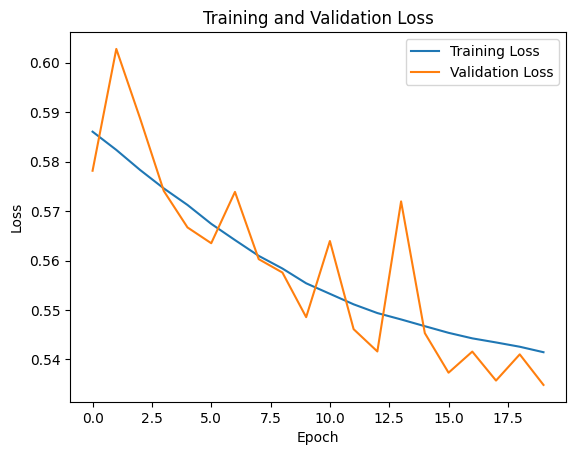

In [122]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

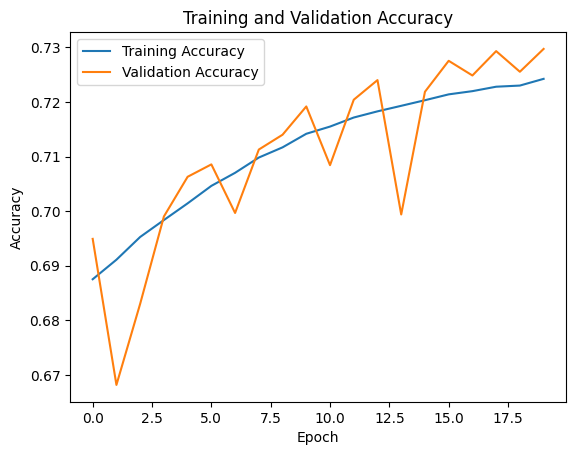

In [123]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()